In [12]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy import stats
#from statsmodels.stats.weightstats import ztest
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statistics
from scipy.stats import kurtosis,skewnorm, skew
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, max_error, mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt
pd.options.display.max_rows = 4000
from sklearn.impute import KNNImputer
pd.options.display.max_columns = 4000
%matplotlib inline
from sklearn.preprocessing import LabelEncoder

## Null Hypothesis: There is no significance difference in weight across the group
## Alternative hypothesis: There is significance difference in atleast one pair in 'class'
### For the check null_hypothesis will be used ANOVA oneway-test:

In [13]:
df = pd.read_excel('cortex_nuclear_eda.xls')

In [14]:
df_copy = df.copy(deep=True)

In [15]:
#Deleting not needed columns
def clean_data(data):
    data.drop(['Genotype','Behavior','Treatment','MouseID'], axis=1, inplace=True)
    return data.reset_index(drop=True)
    

In [16]:
#Imputation data
def impute_data(data):
    imputer = KNNImputer(n_neighbors=2)
    imputed_data = pd.DataFrame(imputer.fit_transform(data.iloc[:,:-1]), columns=data.columns[:-1])
    imputed_data['class'] = data['class']
    return imputed_data

In [17]:
#Hadling outliers 
def outlier_data(data):
    result = pd.DataFrame()
    threshold=0.95
    for column in data.columns[:-1]:
        hadled_col = data[
            (data[column] >= data[column].quantile(1-threshold)) 
            &  (data[column] <= data[column].quantile(threshold))][column]
        result[column] = hadled_col
    result['class'] = data['class']
    return result

In [18]:
#Handling skew of data
def _log(data):
    result = pd.DataFrame()
    for column in data.columns[:-1]:
        result_column = np.log10(data[column])
        result[column] = result_column
    result['class'] = data['class']
    return result

In [19]:
#Normalization data
def normalization_data(data): 
    scaler = StandardScaler()
    result = pd.DataFrame()
    column_scaled = scaler.fit_transform(data.iloc[:,0:-1])
    result = pd.DataFrame(column_scaled, columns=data.columns[0:-1])
    result['class'] = data['class']
    return result

In [20]:
def plotting_histograms(cleaned_data, normal_data):    
    for column in normal_data.columns[:-1]:
        fig, axes = plt.subplots(1,2, figsize=(15,6))
        fig.suptitle('Comparing distributions', fontsize=16)
        axes[0].set_facecolor('black')
        axes[0].set_title(f'Original distribution {column}')
        axes[0].set_xlabel(column)
        axes[1].set_facecolor('yellow')
        axes[1].set_xlabel(column)
        axes[1].set_title(f'Normal distribution {column}')
        sns.histplot(cleaned_data[column], ax=axes[0], color='white', kde=True)
        sns.histplot(normal_data[column], ax=axes[1], color='g', kde=True)
        plt.savefig(f'distribution_comparing/{column}.png')

#### There are was delete next columns: 'Genotype','Behavior','Treatment','MouseID'

In [21]:
cleaned_data = clean_data(df_copy)

In [22]:
def boxplot_outliers(data):
    for i,column in enumerate(data.columns[:-1]):
        fig, axes = plt.subplots(1, figsize=(10,10), dpi= 100)
        sns.boxplot(data=data, x='class', y=column).set(title='Column with outliers')
        plt.savefig(f'outliers/{column}.png')

C:\Users\Roman Kubyshkin\AppData\Local\Temp\ipykernel_1968\1166053693.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, figsize=(10,10), dpi= 100)


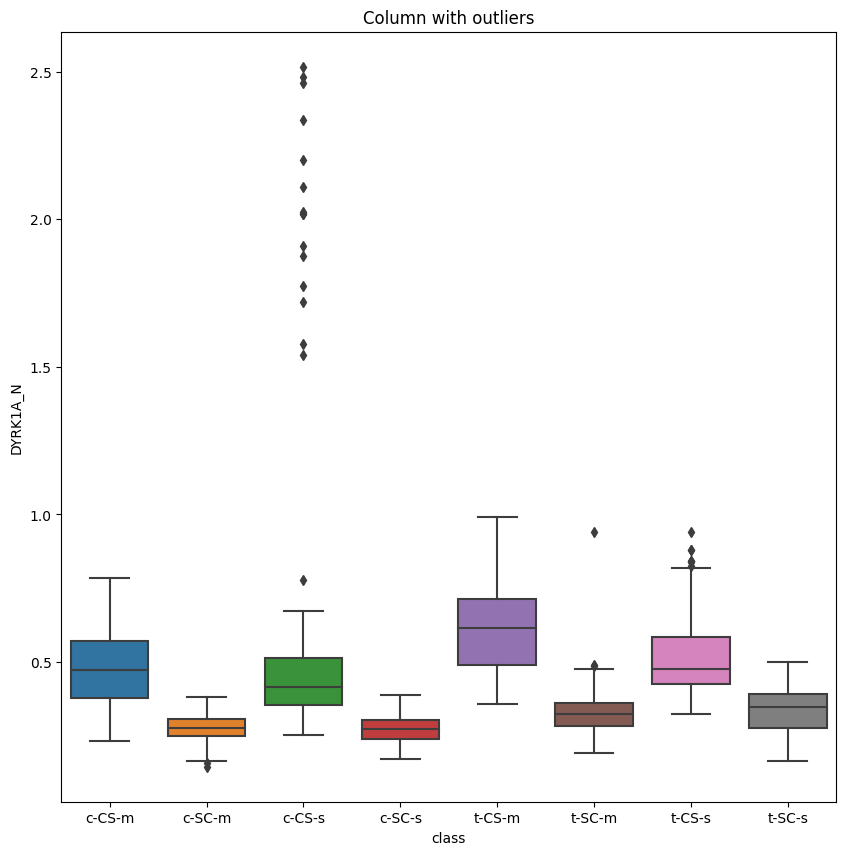

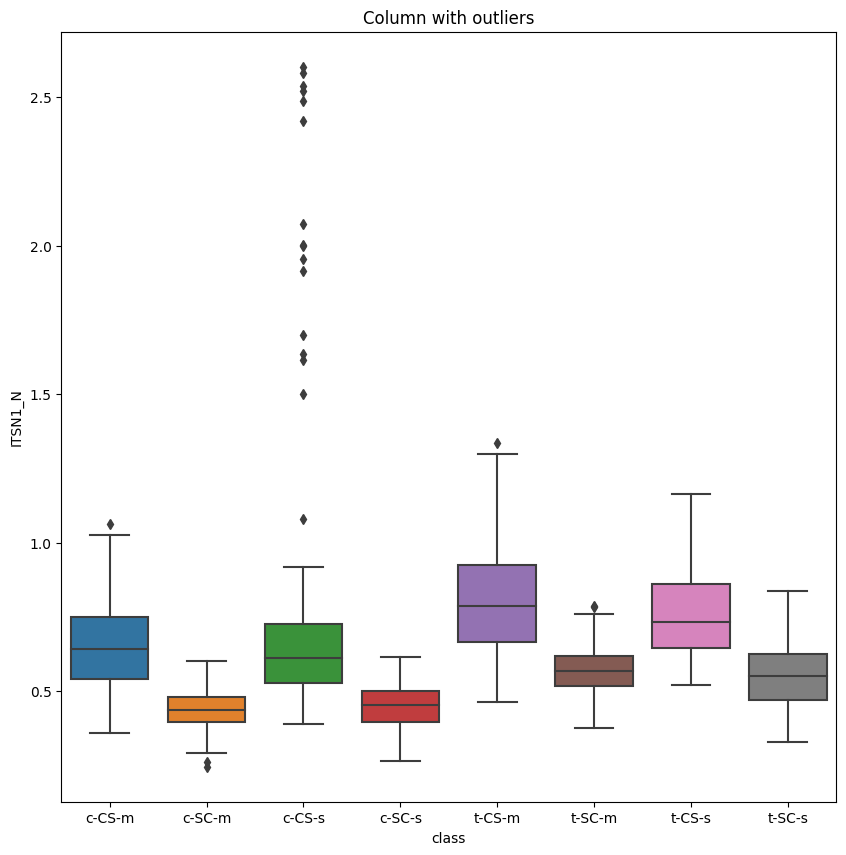

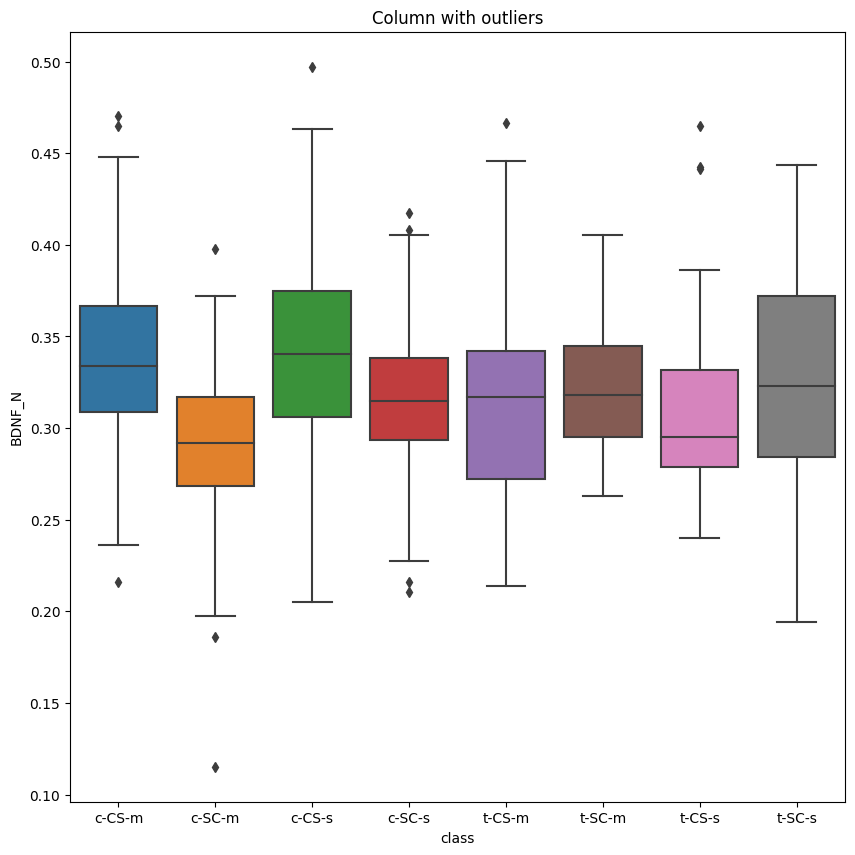

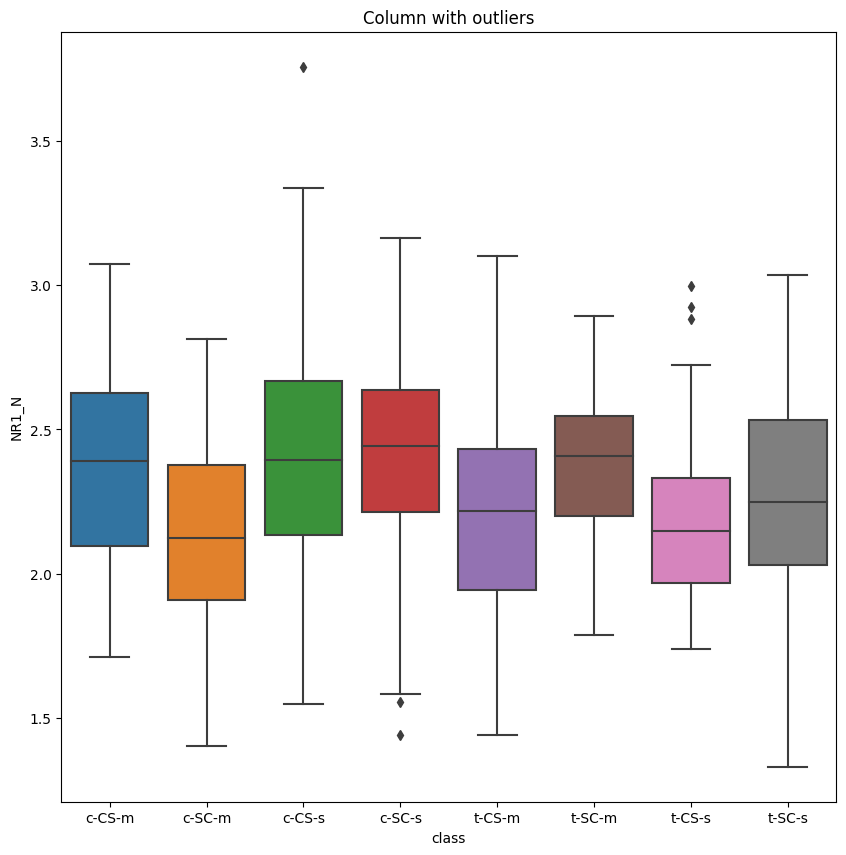

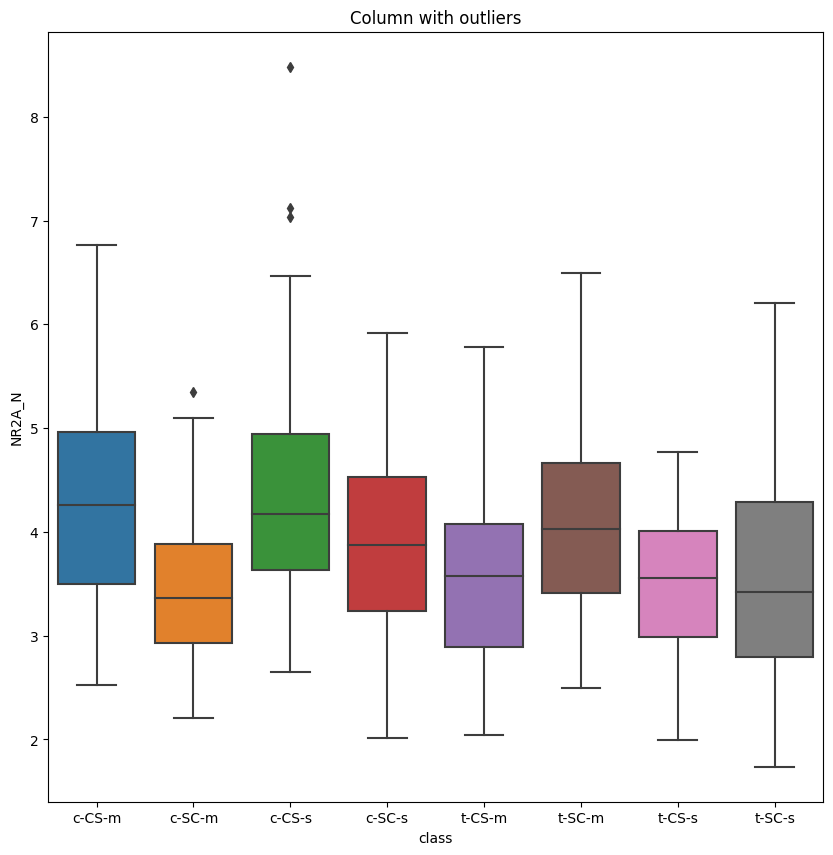

...

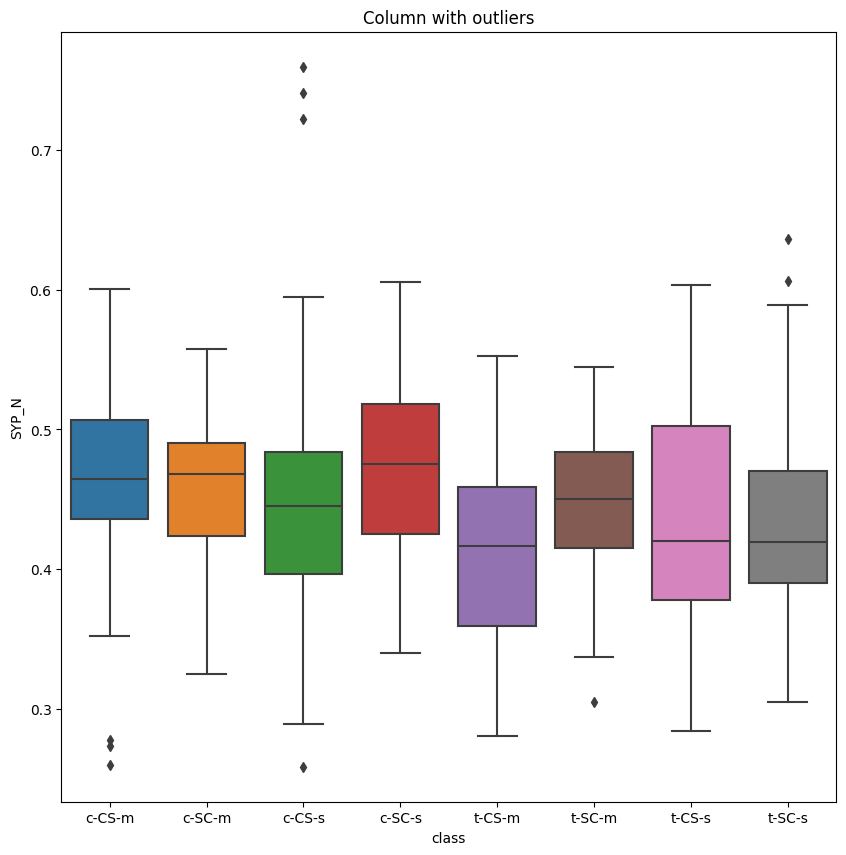

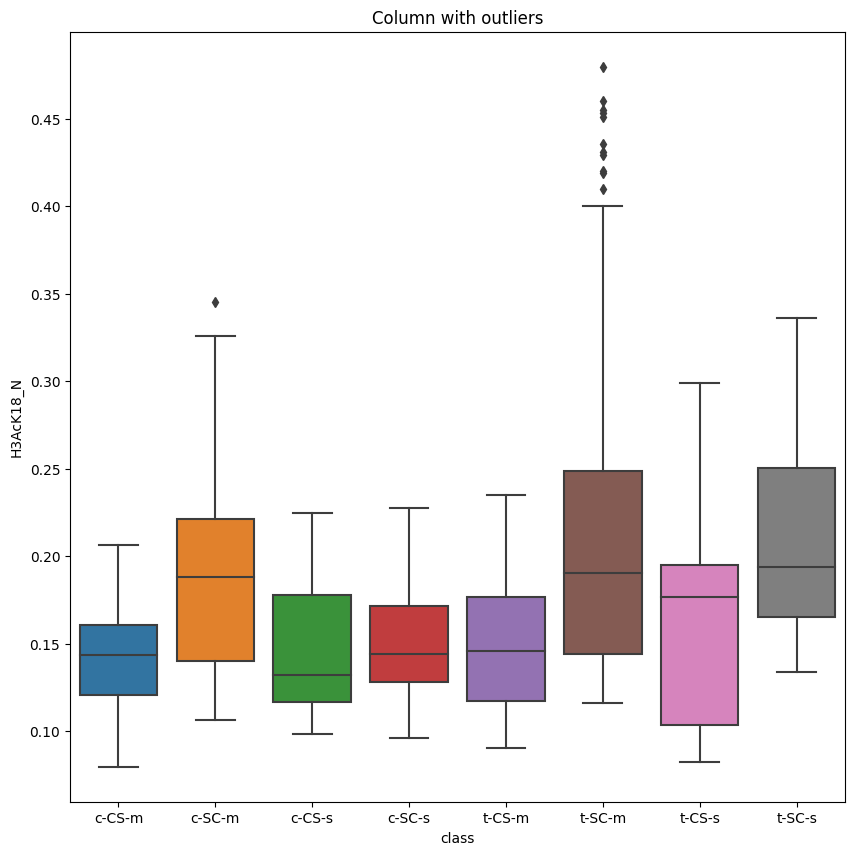

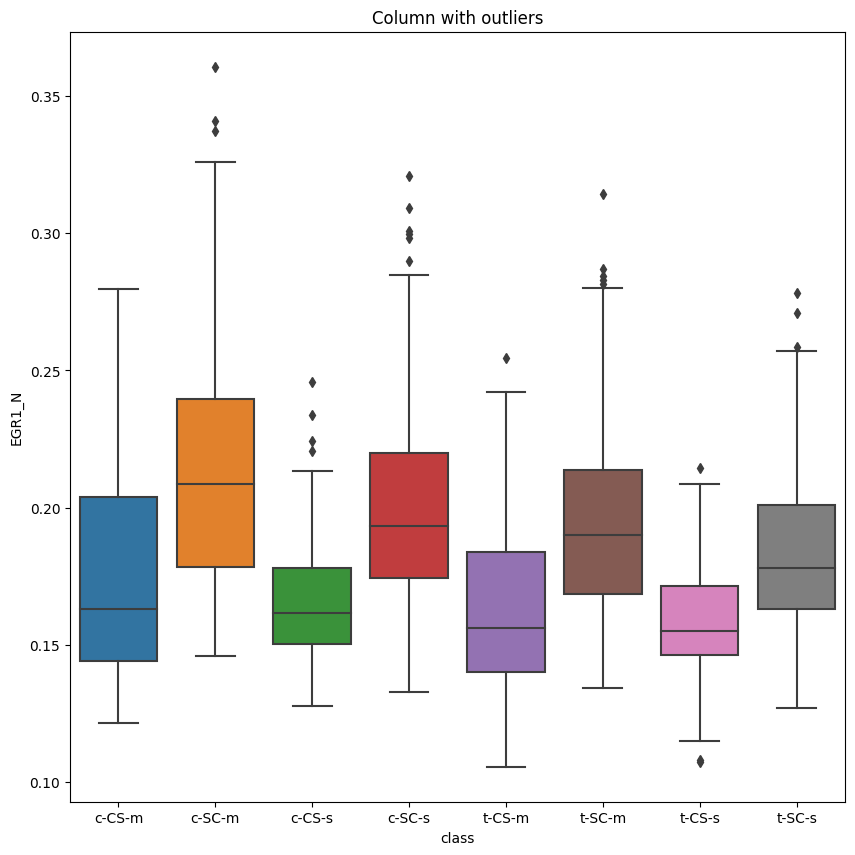

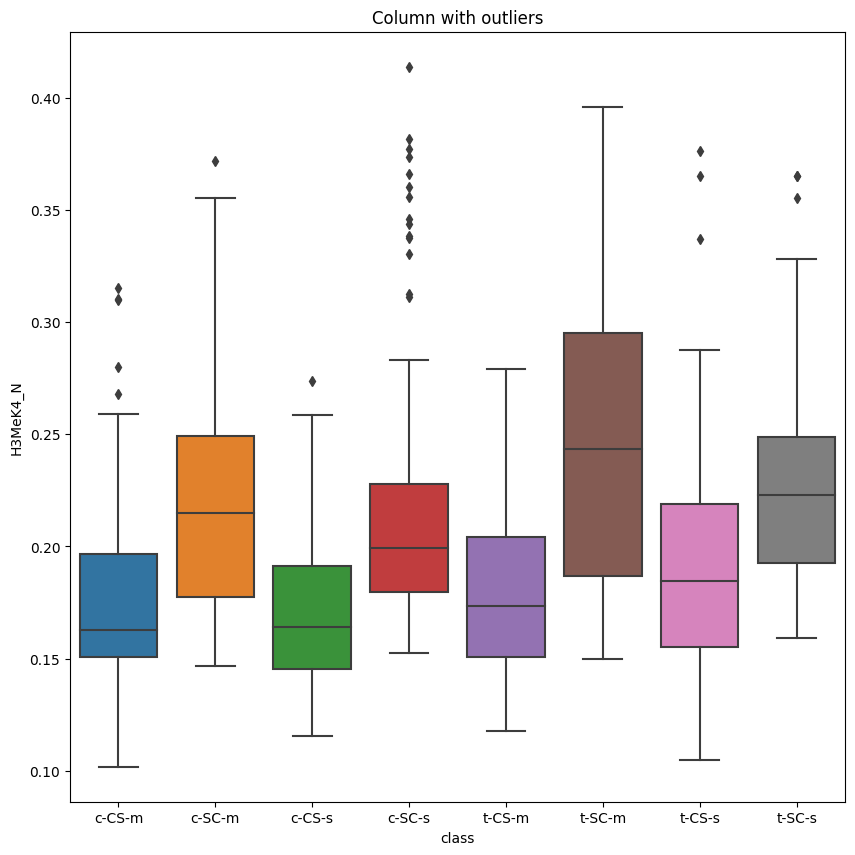

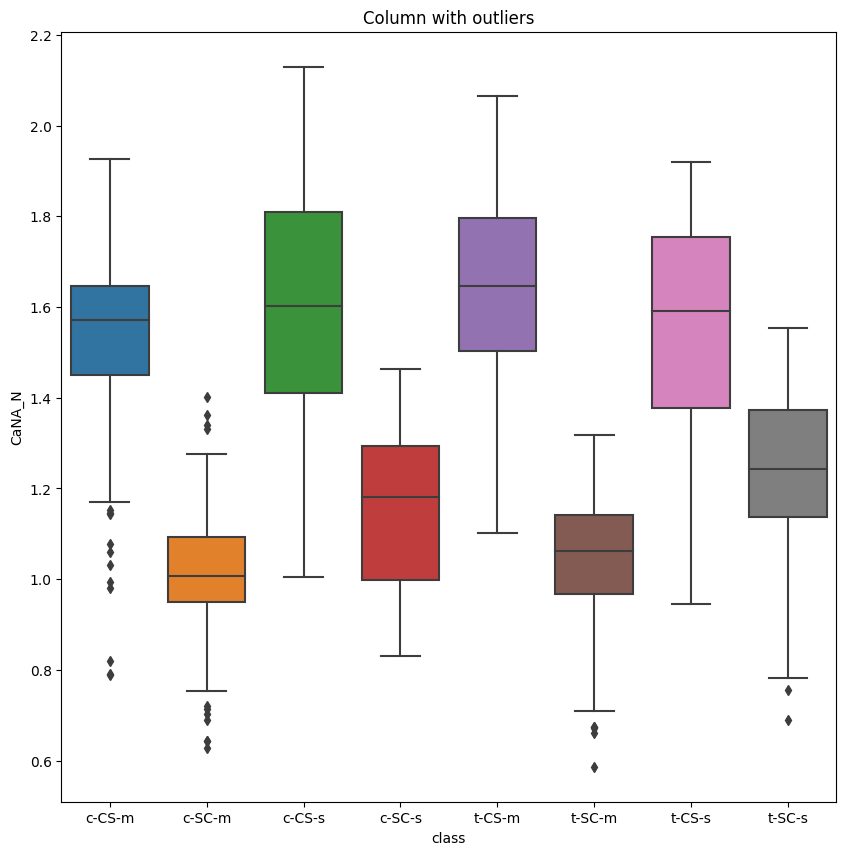

In [23]:
boxplot_outliers(cleaned_data)

## There are was handled outliers

In [24]:
balanced_data = outlier_data(cleaned_data)

## Dataset was imputed, after that remaining rows with nan values was deleted

In [25]:
imputed_data = impute_data(balanced_data)

In [26]:
dropped_data = imputed_data.dropna()

In [27]:
def boxplot_handled_outliers(data):
    for column in data.columns[:-1]:
        fig, axes = plt.subplots(1, figsize=(10,10), dpi= 100)
        sns.boxplot(data=data, x='class', y=column).set(title='Column without outliers')
        plt.savefig(f'outliers_handled/{column}.png')

C:\Users\Roman Kubyshkin\AppData\Local\Temp\ipykernel_1968\198576997.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, figsize=(10,10), dpi= 100)


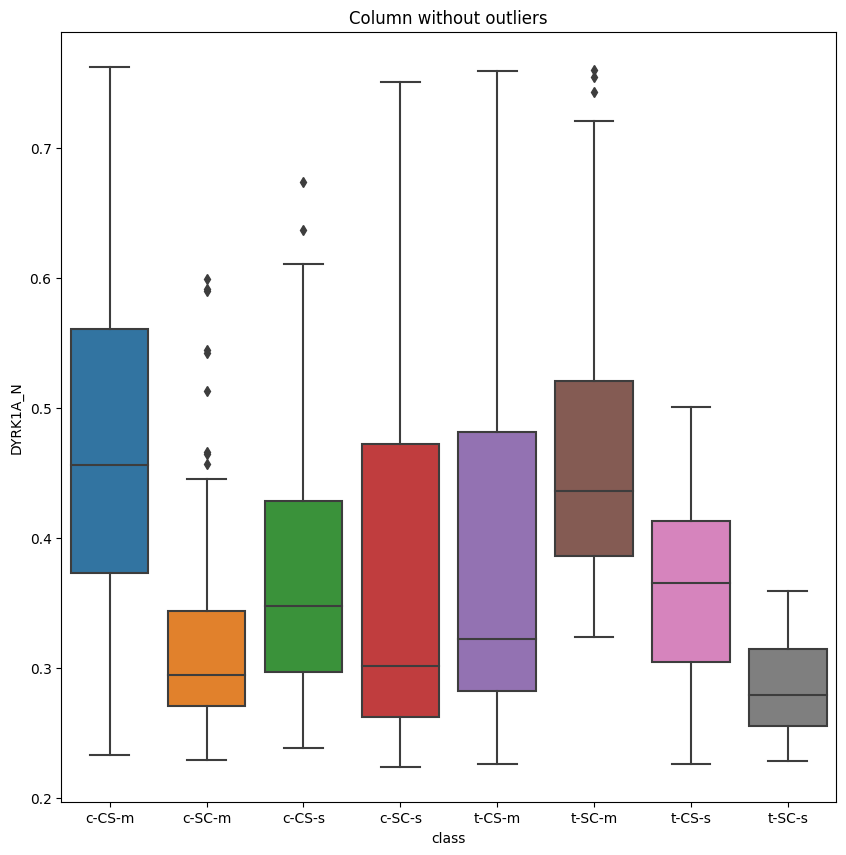

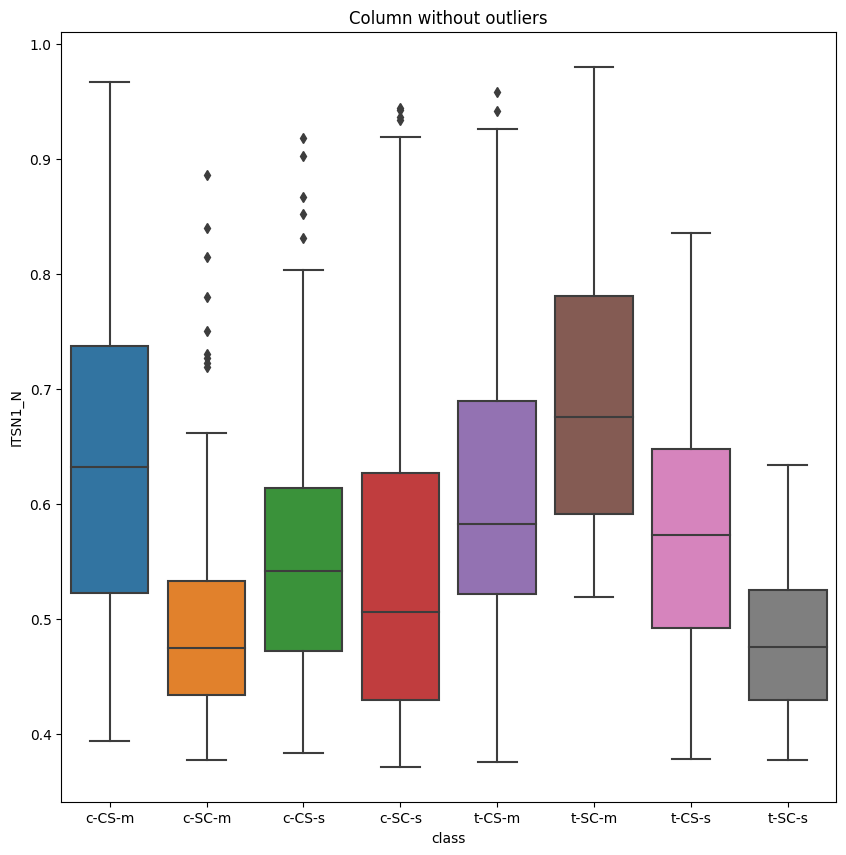

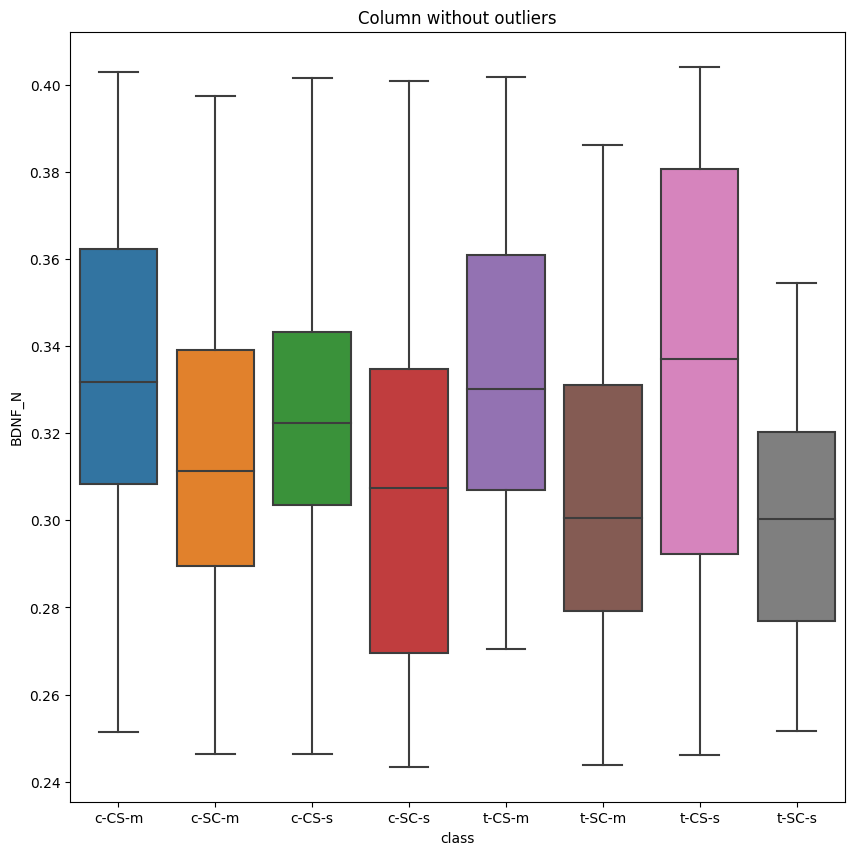

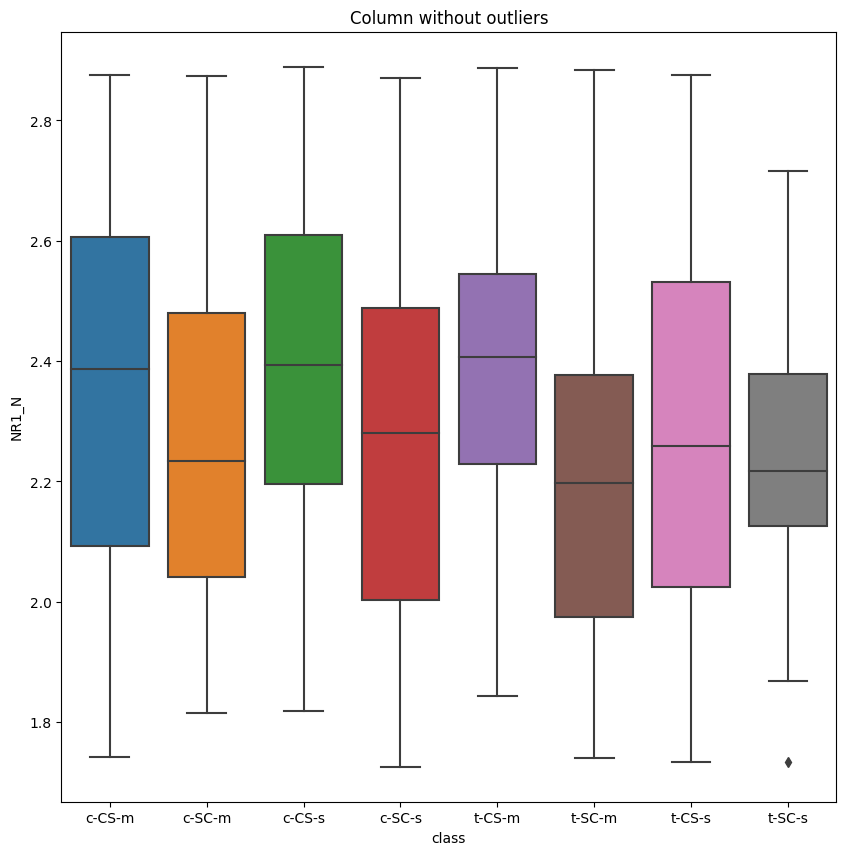

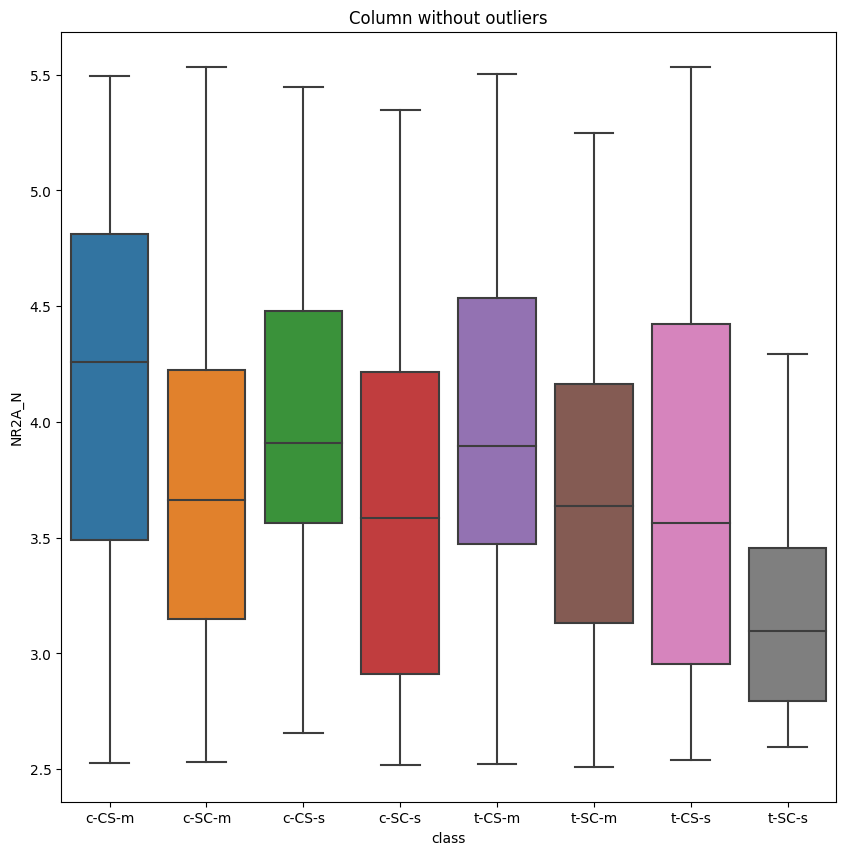

...

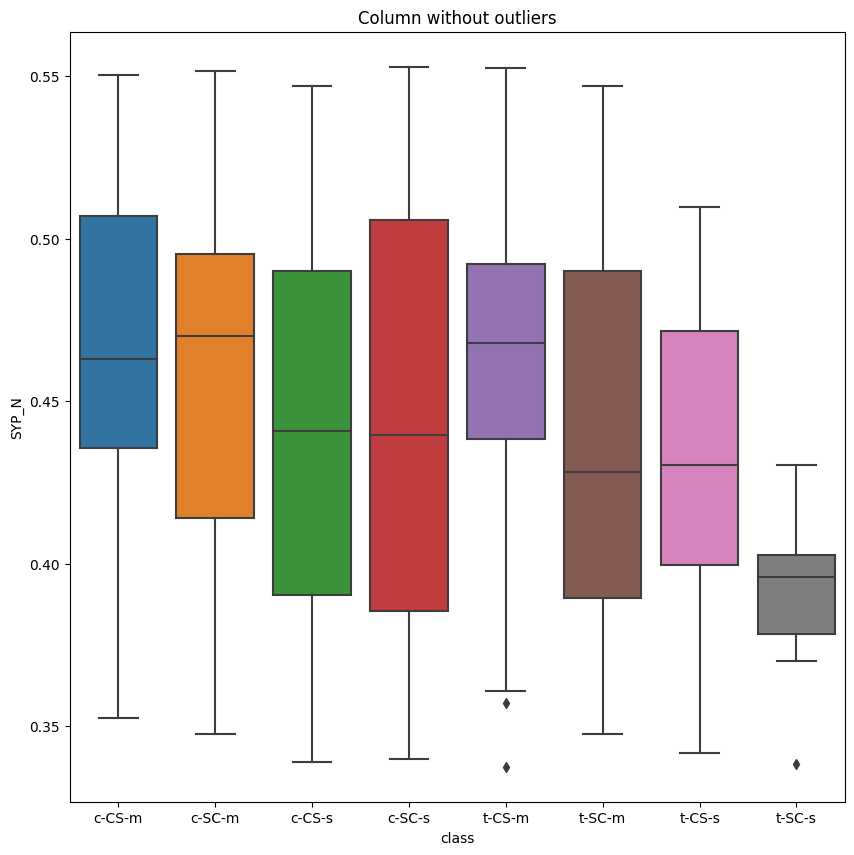

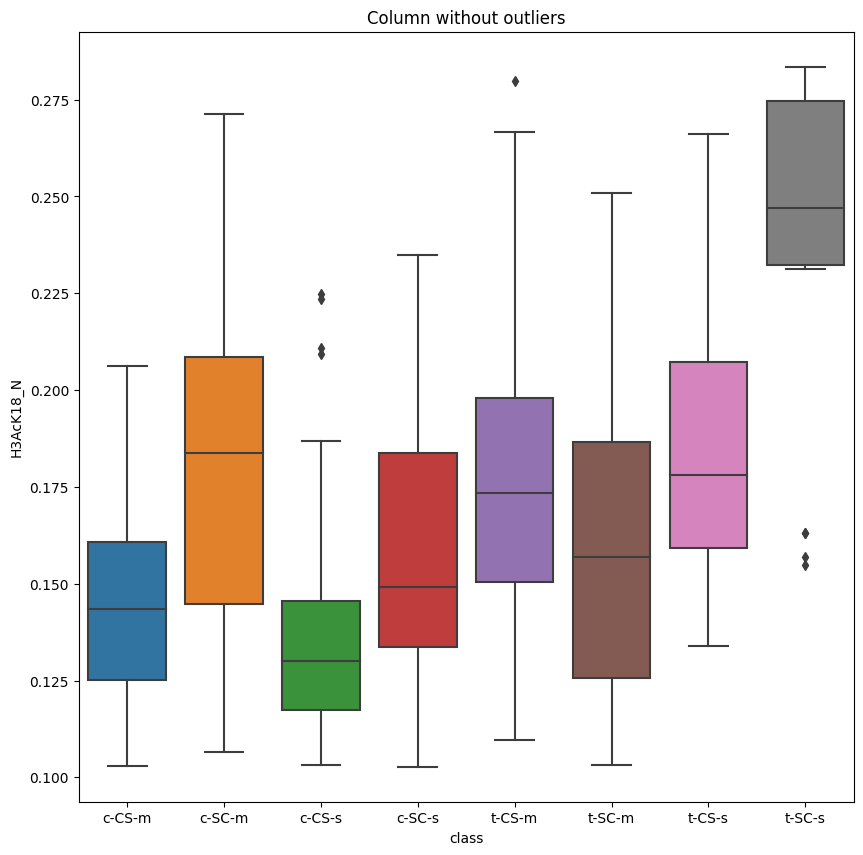

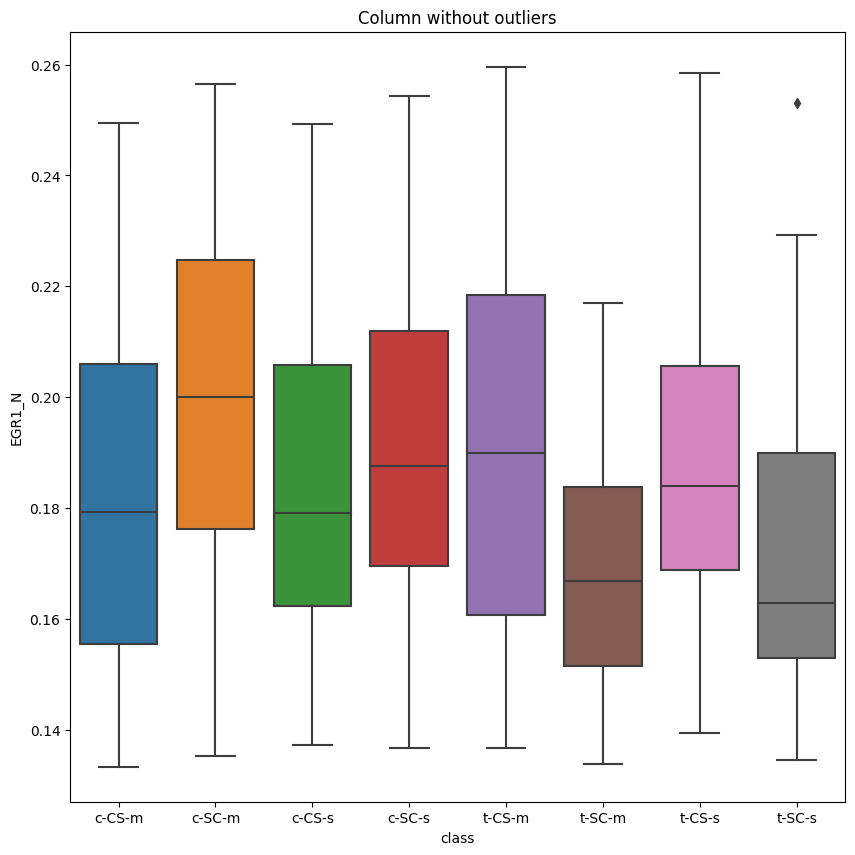

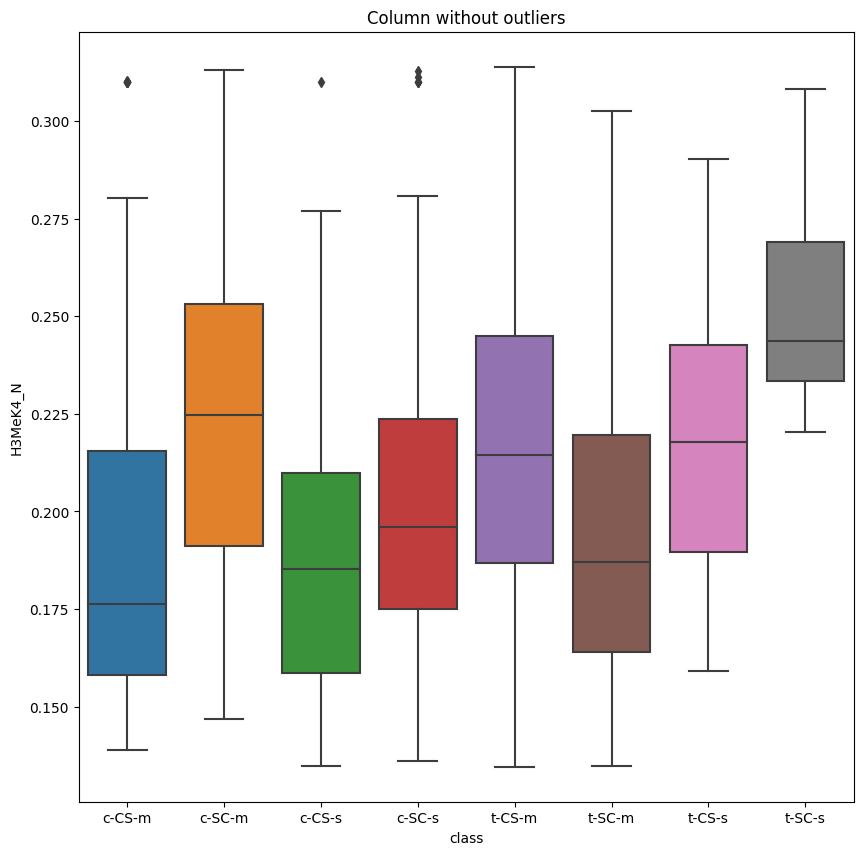

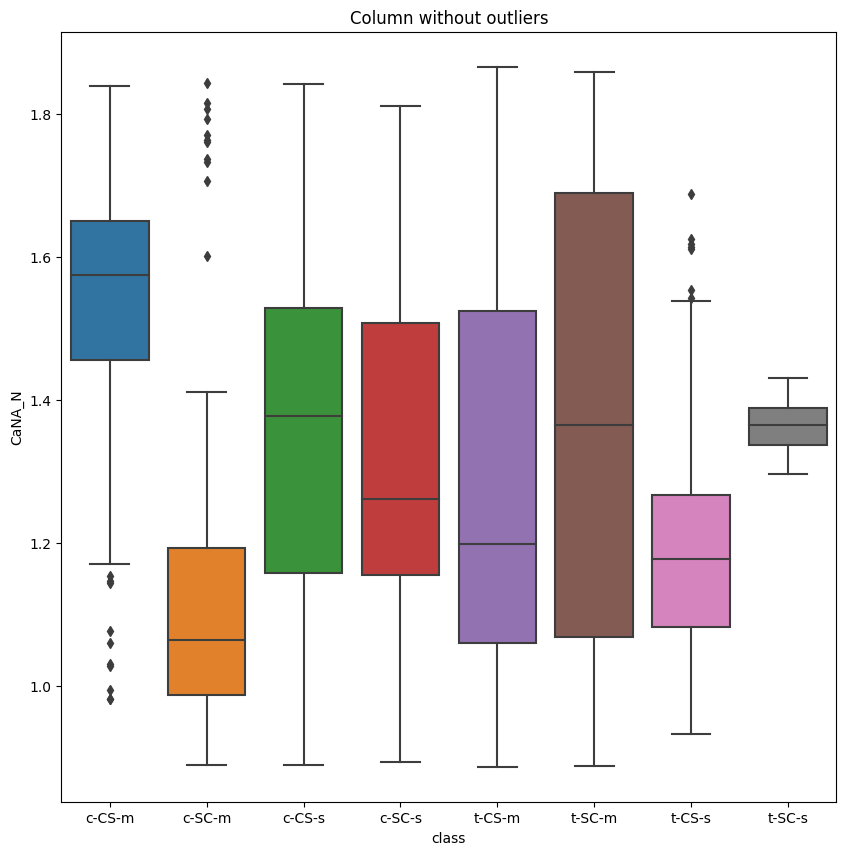

In [28]:
boxplot_handled_outliers(dropped_data)

In [29]:
dropped_data.corr()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,PKCA_N,pMEK_N,pNR1_N,pNR2A_N,pNR2B_N,pPKCAB_N,pRSK_N,AKT_N,BRAF_N,CAMKII_N,CREB_N,ELK_N,ERK_N,GSK3B_N,JNK_N,MEK_N,TRKA_N,RSK_N,APP_N,Bcatenin_N,SOD1_N,MTOR_N,P38_N,pMTOR_N,DSCR1_N,AMPKA_N,NR2B_N,pNUMB_N,RAPTOR_N,TIAM1_N,pP70S6_N,NUMB_N,P70S6_N,pGSK3B_N,pPKCG_N,CDK5_N,S6_N,ADARB1_N,AcetylH3K9_N,RRP1_N,BAX_N,ARC_N,ERBB4_N,nNOS_N,Tau_N,GFAP_N,GluR3_N,GluR4_N,IL1B_N,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
DYRK1A_N,1.000000,0.900633,0.273621,0.200867,0.247049,-0.179966,-0.163686,-0.196151,-0.031720,0.673567,0.918474,-0.057417,0.349271,-0.125760,0.086238,-0.166698,0.089105,0.463699,0.098247,-0.078686,0.880401,-0.066523,-0.041763,0.271103,0.375113,0.655951,0.138397,0.064420,0.274627,-0.035956,0.402924,0.145239,-0.579995,-0.196129,-0.445961,-0.203360,-0.035058,0.072773,-0.110873,0.314089,-0.093764,0.120148,-0.222267,0.261790,0.157592,0.480378,-0.004383,0.224254,0.403330,0.251792,-0.014798,0.001952,0.044593,-0.354175,-0.209265,-0.172367,0.065140,0.160940,-0.002733,-0.040668,-0.418896,-0.020005,-0.092589,-0.218274,-0.470766,-0.406253,0.188241,-0.191209,-0.248659,-0.265212,-0.354175,-0.223045,-0.097918,-0.283879,-0.416335,-0.410178,0.503765
ITSN1_N,0.900633,1.000000,0.382566,0.382086,0.388619,-0.137160,-0.146932,-0.117426,0.154151,0.629444,0.822143,0.071566,0.385087,-0.033592,0.235792,-0.010426,0.262792,0.500403,0.137886,0.106258,0.751933,-0.023392,-0.038368,0.488834,0.535426,0.751112,0.192948,0.217477,0.471442,-0.020686,0.558674,0.370659,-0.439409,-0.172772,-0.445630,-0.117195,-0.012527,0.125479,-0.043799,0.285780,-0.122373,0.213211,-0.241523,0.446172,0.350597,0.452671,0.060189,0.367842,0.497244,0.373744,0.060239,-0.057906,0.230905,-0.201203,-0.027982,-0.016324,0.205514,0.077573,-0.014427,0.010607,-0.353009,0.085272,0.049445,-0.069664,-0.446099,-0.265213,0.273111,-0.203756,-0.386982,-0.388182,-0.201203,-0.358981,0.030745,-0.275043,-0.526455,-0.472206,0.500471
BDNF_N,0.273621,0.382566,1.000000,0.759584,0.726953,0.379498,0.418156,0.274408,0.547480,0.487608,0.274435,0.571312,0.734555,0.518791,0.693302,0.454108,0.669400,0.495461,0.390991,0.596834,0.250185,0.515935,0.365367,0.664644,0.661141,0.625151,0.675192,0.703418,0.766432,0.374369,0.525390,0.703104,0.035348,0.499110,0.155396,0.489698,0.393357,0.673367,0.612727,0.552501,0.471515,0.554715,0.033203,0.316947,0.204271,0.292688,0.088428,0.374480,0.052527,0.545405,0.074242,0.032624,0.382191,0.197986,0.257981,0.161586,0.104415,0.108589,-0.033513,0.168158,-0.178080,0.249537,0.113003,0.091552,-0.106676,0.168144,0.059012,-0.130271,-0.200247,-0.120217,0.197986,-0.244422,0.449929,-0.047673,-0.194635,-0.244868,0.147883
NR1_N,0.200867,0.382086,0.759584,1.000000,0.853022,0.258766,0.273253,0.296109,0.585862,0.403134,0.196377,0.539077,0.521279,0.413772,0.914664,0.599670,0.886321,0.353429,0.229400,0.707093,0.105337,0.421003,0.179985,0.798573,0.757753,0.636297,0.560779,0.621399,0.833163,0.268644,0.402970,0.899800,0.219511,0.371884,0.075381,0.493108,0.170952,0.535365,0.521444,0.262168,0.210140,0.375376,-0.117133,0.449465,0.442487,0.051932,-0.036585,0.314232,0.036845,0.508775,-0.041966,-0.168792,0.422466,0.352585,0.336463,0.389933,0.025724,-0.125505,0.147457,0.206112,-0.037081,0.142147,0.239007,0.388340,-0.140317,0.243962,0.062756,-0.175857,-0.424923,-0.271973,0.352585,-0.383501,0.463294,-0.245142,-0.289976,-0.358849,0.088283
NR2A_N,0.247049,0.388619,0.726953,0.853022,1.000000,0.192865,0.145227,0.291742,0.390043,0.403407,0.269932,0.481832,0.501713,0.306323,0.841636,0.596642,0.866384,0.352509,0.143338,0.672554,0.112722,0.326068,0.086394,0.773445,0.848278,0.636615,0.452203,0.557079,0.761846,0.089187,0.364107,0.858084,0.048552,0.372043,0.032597,0.457629,0.187968,0.609048,0.491197,0.425440,0.294907,0.444781,-0.212903,0.499242,0.466184,0.133823,-0.112517,0.331689,0.050508,0.657791,-0.071175,-0.119794,0.546461,0.331331,0.301772,0.312

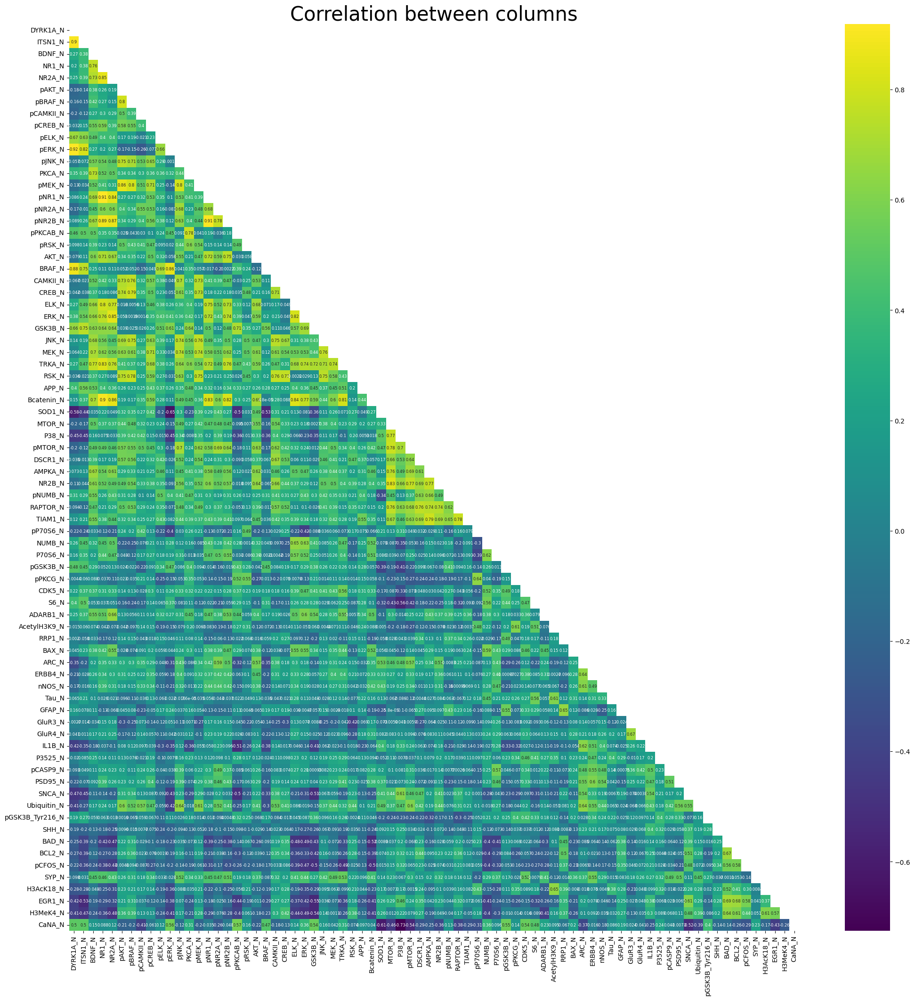

In [72]:
def df_corr(df):
    plt.figure(figsize = (25,25))
    corr = df.corr()
    matrix = np.triu(corr)
    heatmap = sns.heatmap(
        corr, 
        mask = matrix, 
        cmap="viridis",
        annot=True,
        annot_kws={"fontsize":6}
    )
    
    heatmap.set_title('Correlation between columns', fontdict={'size': 30})
    plt.savefig(f'other_plots/heatmap_plot.png')
    
df_corr(dropped_data)

#### Column 'pS6_N' identical as 'ARC_N' - deleted it

In [31]:
dropped_data = dropped_data.drop('pS6_N', axis=1)

In [32]:
nonskewed_data = _log(dropped_data)

In [33]:
normal_data = normalization_data(nonskewed_data) 

C:\Users\Roman Kubyshkin\AppData\Local\Temp\ipykernel_1968\2235512145.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1,2, figsize=(15,6))


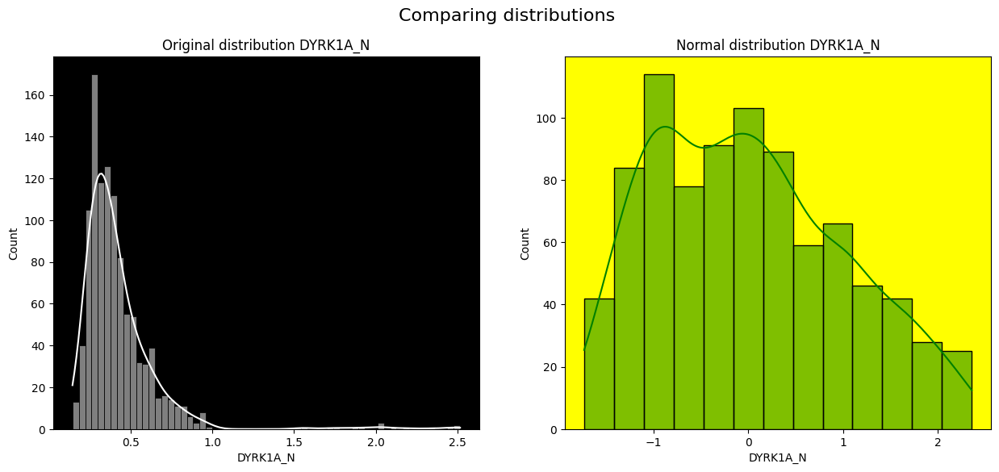

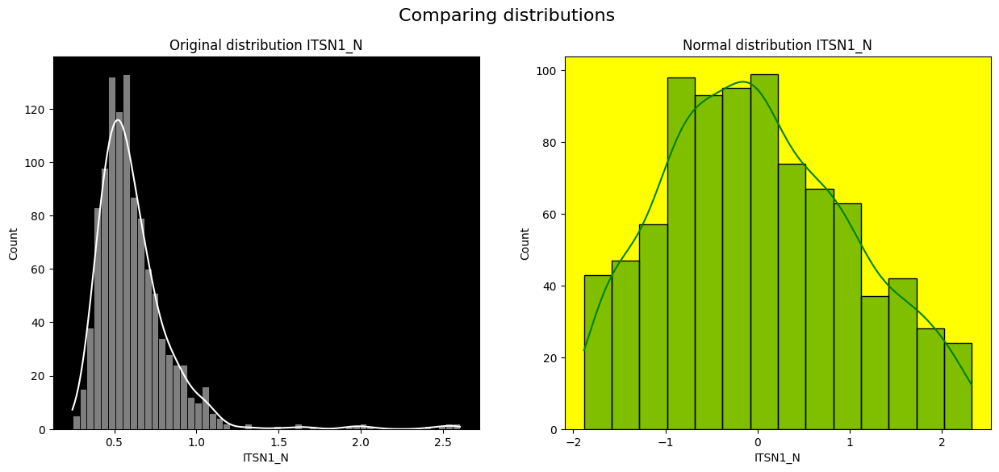

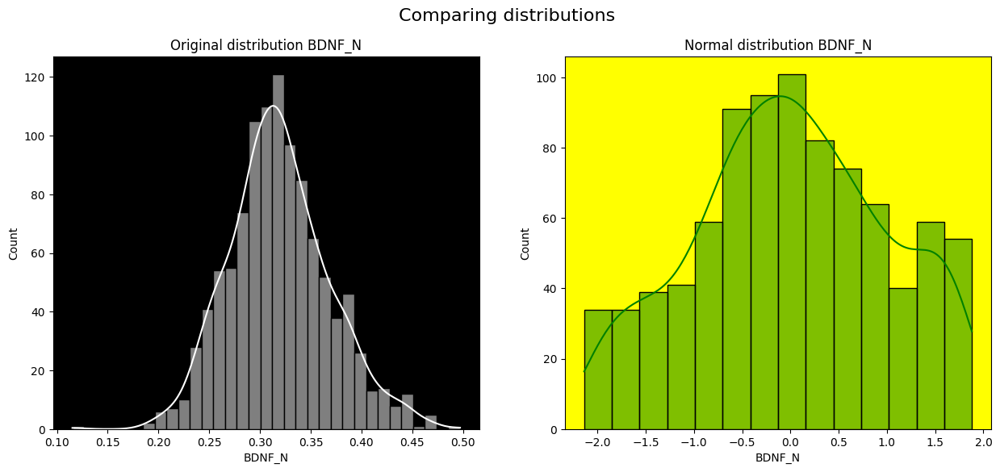

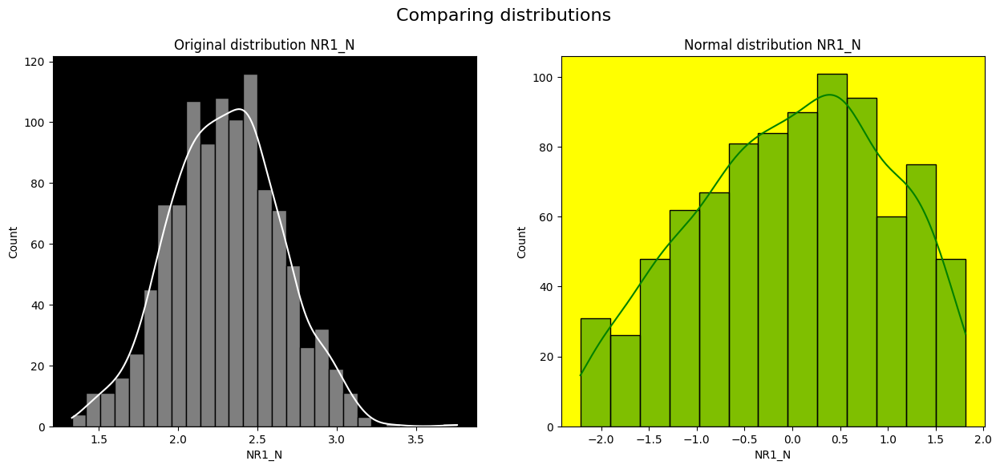

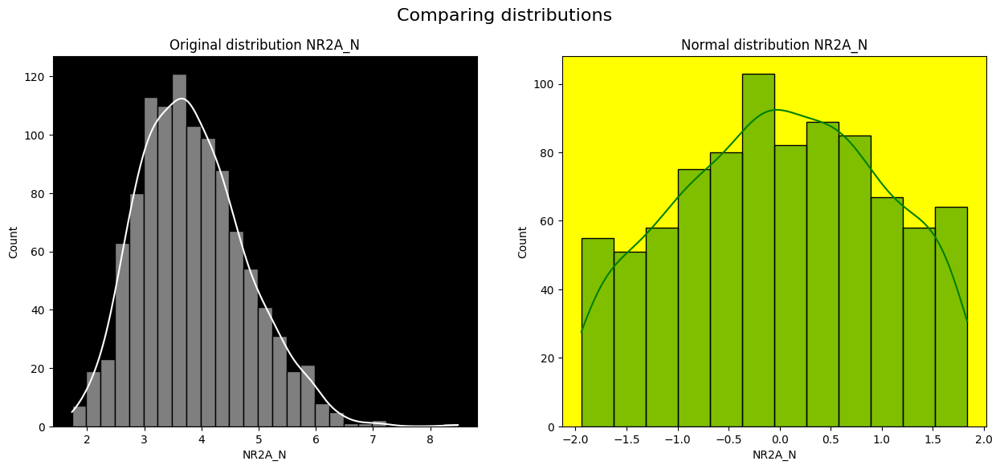

...

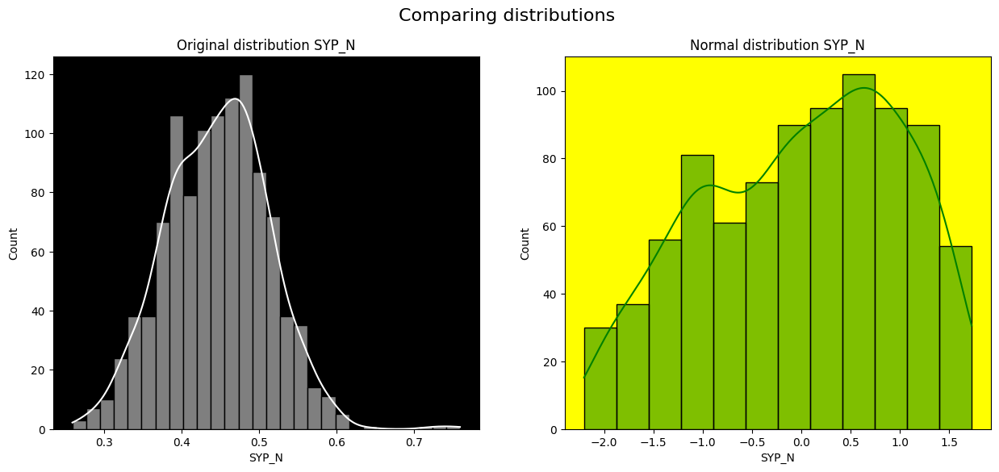

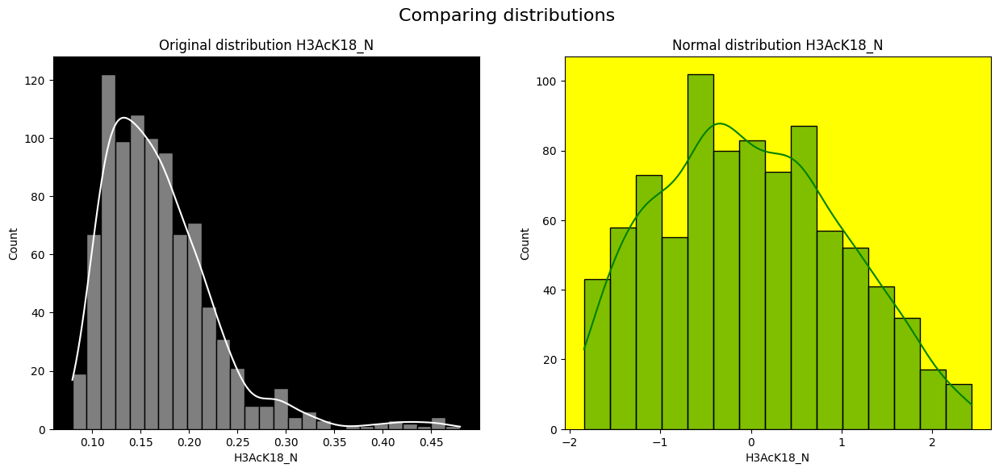

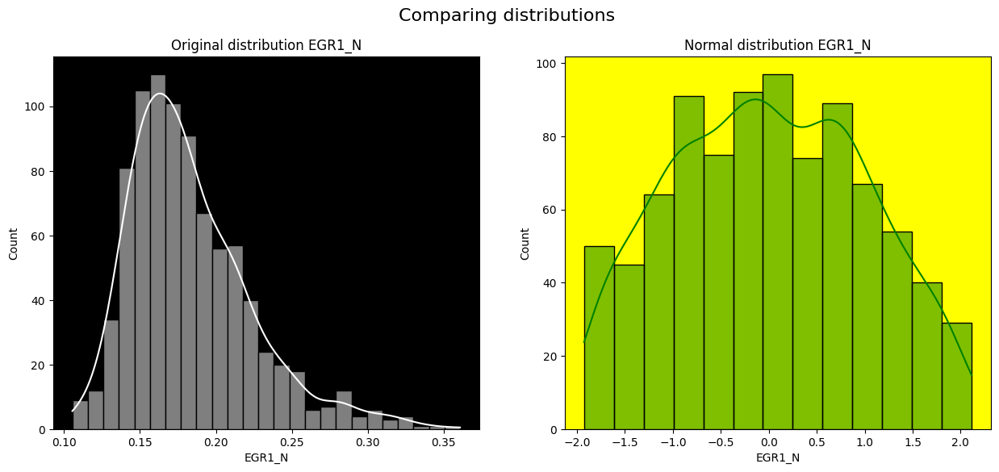

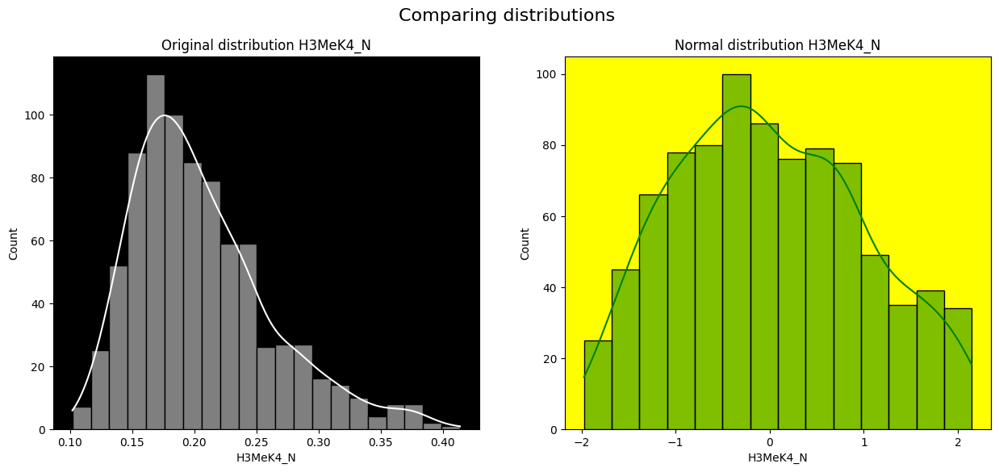

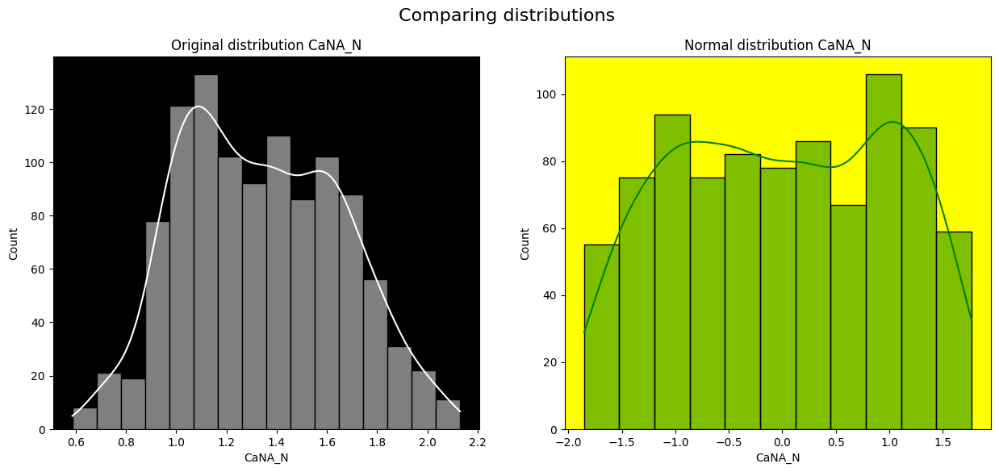

In [34]:
plotting_histograms(cleaned_data, normal_data)

In [35]:
#ANOVA one-way test
def anova_test(data, category_column):
    result = pd.DataFrame()
    for column in data.columns[:-1].values:
        mod=ols(f'{column}~{category_column}', data=data).fit()
        aov_table=sm.stats.anova_lm(mod, type=2)
        if(aov_table['PR(>F)'].values[0] < 0.05):
            pair_t = mod.t_test_pairwise(category_column)
            result_pair_test = pair_t.result_frame
            reject_nh = result_pair_test['reject-hs'].values.tolist()
            result[column] = reject_nh

    classes = result_pair_test.index.values.tolist()
    result['cl'] = classes
    return result
normal_data = normal_data.rename(columns={'class' : 'cl'})
anova_data = anova_test(normal_data, 'cl')
anova_data
# Check for containing part of pairclasses    
#r = result[result['Classes'].str.contains('t-SC-m-t-CS-s')]

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,PKCA_N,pMEK_N,pNR1_N,pNR2A_N,pNR2B_N,pPKCAB_N,pRSK_N,AKT_N,BRAF_N,CAMKII_N,CREB_N,ELK_N,ERK_N,GSK3B_N,JNK_N,MEK_N,TRKA_N,RSK_N,APP_N,SOD1_N,MTOR_N,P38_N,pMTOR_N,DSCR1_N,AMPKA_N,NR2B_N,pNUMB_N,RAPTOR_N,TIAM1_N,pP70S6_N,NUMB_N,P70S6_N,pGSK3B_N,pPKCG_N,CDK5_N,S6_N,ADARB1_N,AcetylH3K9_N,RRP1_N,BAX_N,ARC_N,ERBB4_N,nNOS_N,Tau_N,GFAP_N,GluR3_N,GluR4_N,IL1B_N,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,BAD_N,BCL2_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,cl
0,True,True,True,False,True,False,False,False,True,True,True,False,True,False,False,True,False,True,False,True,True,False,False,False,True,True,False,False,True,False,True,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,True,True,True,True,False,False,False,False,False,True,False,True,False,False,True,True,False,True,False,True,False,False,False,False,True,False,False,False,True,c-CS-s-c-CS-m
1,True,True,False,False,True,True,False,True,True,True,True,False,False,True,False,True,False,False,False,False,True,False,False,False,True,True,False,False,False,False,True,True,False,True,True,False,False,False,True,False,False,True,True,False,True,True,True,True,True,True,False,False,False,False,False,True,True,False,False,False,False,False,False,True,True,True,False,False,False,False,False,True,True,True,True,c-SC-m-c-CS-m
2,True,False,True,True,True,False,False,False,False,True,True,True,True,False,True,False,True,True,False,True,False,True,False,False,True,True,True,False,True,False,True,True,True,False,True,True,True,True,True,True,True,True,False,False,False,True,True,False,True,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,True,False,True,True,c-SC-s-c-CS-m
3,True,False,True,False,True,True,True,True,True,False,True,True,False,True,False,True,False,True,False,False,True,True,True,False,True,True,False,False,False,True,True,True,False,False,True,True,False,False,True,False,True,True,False,False,True,True,False,False,False,True,False,False,True,True,False,True,False,True,True,False,False,False,False,True,True,False,False,False,False,False,True,True,False,True,True,t-CS-m-c-CS-m
4,True,True,False,False,True,False,False,False,True,True,True,False,True,False,False,False,True,False,False,False,True,False,False,False,True,True,False,False,False,True,True,True,True,False,True,False,True,False,True,False,False,True,False,True,False,True,False,True,True,True,True,False,False,False,False,True,False,True,False,False,True,True,False,False,True,False,False,False,False,False,True,True,False,True,True,t-CS-s-c-CS-m
5,True,False,False,False,True,False,False,False,True,True,True,False,True,False,True,False,False,False,False,False,True,False,False,False,False,True,True,False,False,False,True,True,True,False,True,False,True,True,True,False,True,True,False,False,False,True,False,True,False,True,True,True,True,False,True,True,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,True,False,True,True,t-SC-m-c-CS-m
6,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,False,False,True,True,False,False,True,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,True,False,True,True,True,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,False,False,False,True,False,True,False,c-SC-m-c-CS-s
7,True,True,False,True,False,False,False,False,False,False,True,True,False,True,True,True,True,False,True,True,True,True,False,False,False,True,False,False,False,True,True,True,True,True,True,False,True,True,False,False,False,True,False,False,True,True,False,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,True,False,False,False,False,F

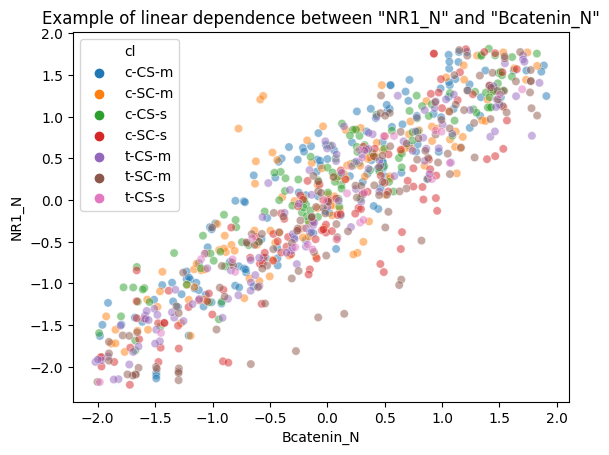

In [66]:
fig = sns.scatterplot(data=normal_data, x='Bcatenin_N', y='NR1_N', hue='cl',alpha=0.5)
fig.set_title('Example of linear dependence between "NR1_N" and "Bcatenin_N"')
plt.savefig(f'other_plots/scatter_plot_NR1_N-Bcatenin_N.png')

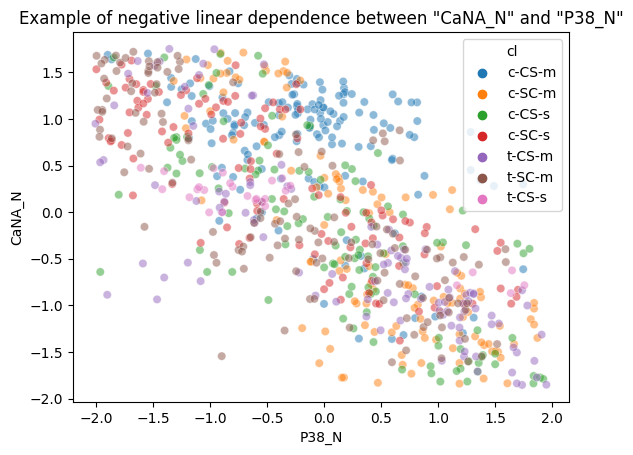

In [67]:
fig = sns.scatterplot(data=normal_data, x='P38_N', y='CaNA_N', hue='cl',alpha=0.5)
fig.set_title('Example of negative linear dependence between "CaNA_N" and "P38_N"')
plt.savefig(f'other_plots/scatter_plot_P38_N-CaNA_N.png')

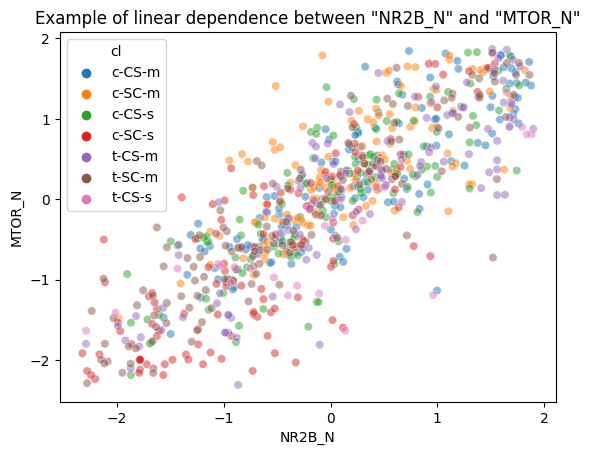

In [68]:
fig = sns.scatterplot(data=normal_data, x='NR2B_N', y='MTOR_N', hue='cl',alpha=0.5)
fig.set_title('Example of linear dependence between "NR2B_N" and "MTOR_N"')
plt.savefig(f'other_plots/scatter_plot_NR2B_N_MTOR_N.png')

# As we can see, there is significance difference in atleast one pair in 'cl'. Reject null hypothesis and accept alternative hypothesis